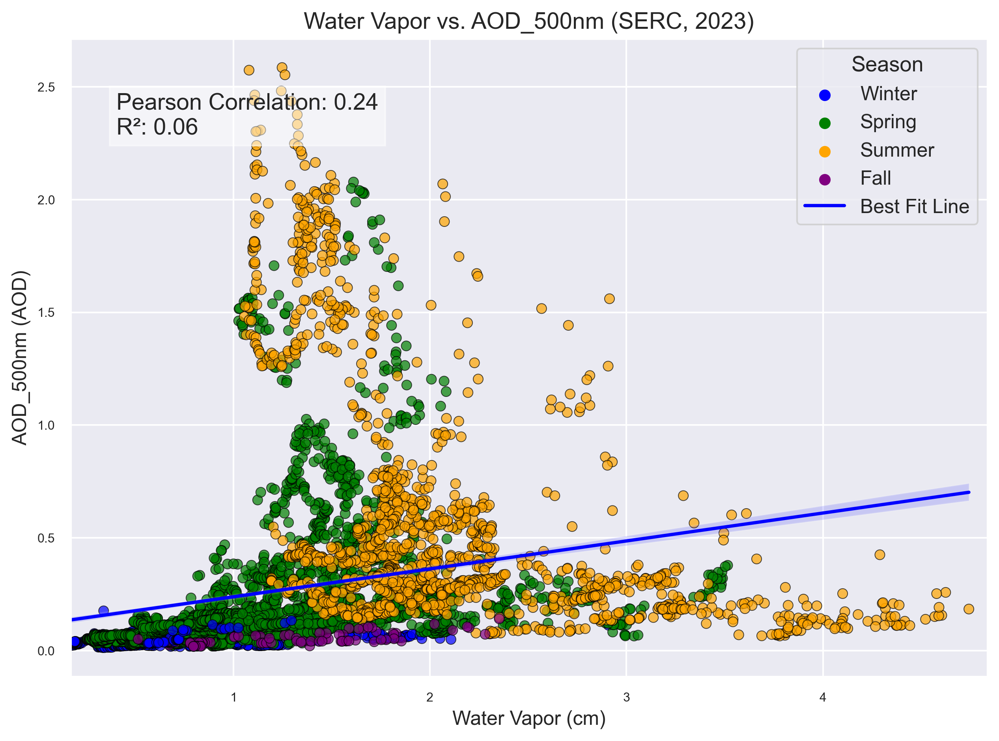

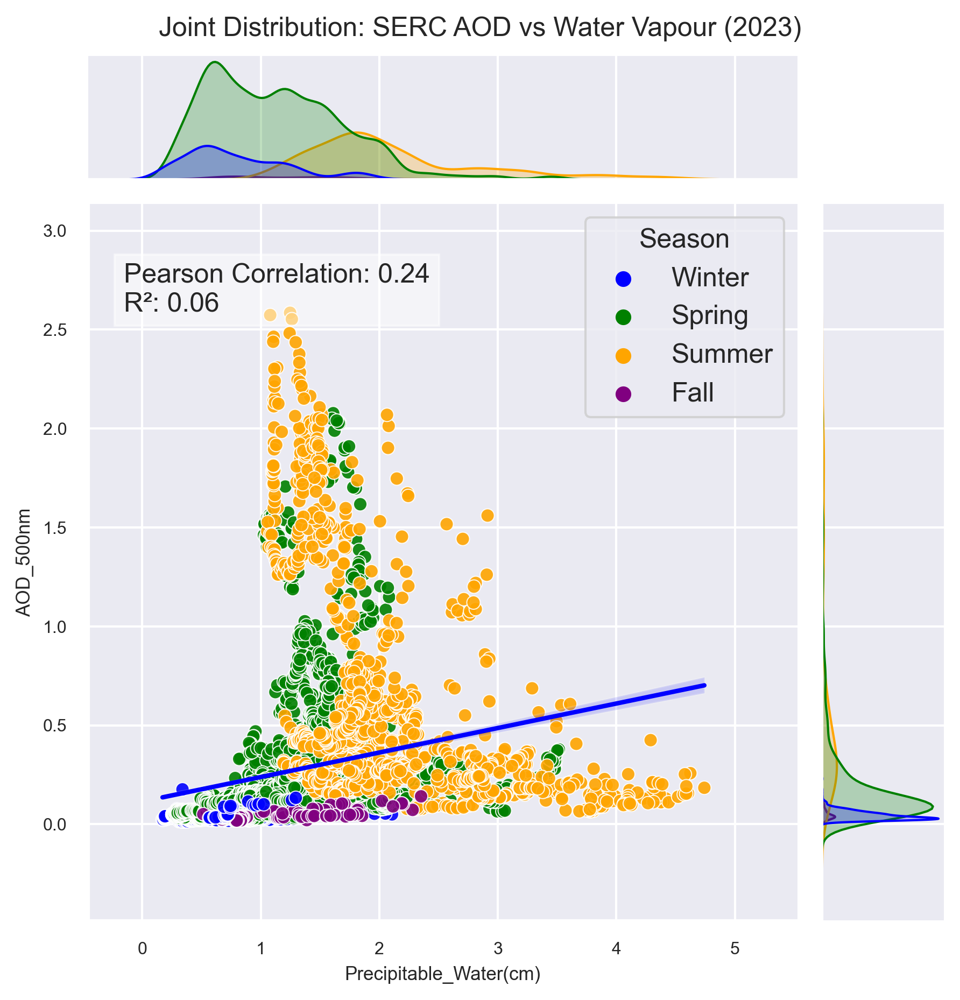

In [3]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

sns.set_theme(rc={"figure.dpi": 300, 'savefig.dpi': 300})
sns.set_theme(font_scale=0.7)

def plot_wv_vs_aod(site, year, aod_wavelength="AOD_500nm", show_one_to_one=True, show_jointplot=True):
    """
    Plots a scatter plot and jointplot showing the relationship between Water Vapor and AOD.
    Calculates Pearson correlation, R², and colors points by season.

    Parameters:
        site (str): The site name (e.g., "HU_IRB", "GSFC", "SERC").
        year (int): The year of the data.
        aod_wavelength (str): The AOD wavelength column to plot (e.g., "AOD_500nm", "AOD_440nm").
        show_one_to_one (bool): Whether to include the one-to-one reference line in the main plot.
        show_jointplot (bool): Whether to include a jointplot with KDE/histograms.
    """
    # Define file path
    data_folder = rf"C:\Users\Sandy\Documents\Aeronet\Data\{site}\Processed"
    file_name = f"{site}_processed_{year}_AOD15_directsun.csv"
    file_path = os.path.join(data_folder, file_name)

    # Read the cleaned data
    df = pd.read_csv(file_path, parse_dates=['DateTime'])

    # Ensure AOD wavelength column exists
    if aod_wavelength not in df.columns:
        print(f"❌ Error: Column '{aod_wavelength}' not found in the dataset.")
        print(f"Available columns: {df.columns.tolist()}")
        return

    # Drop NaN values before regression
    df_clean = df.dropna(subset=["Precipitable_Water(cm)", aod_wavelength]).copy()

    # Compute Pearson correlation coefficient and R² value
    slope, intercept, r_value, p_value, std_err = linregress(df_clean["Precipitable_Water(cm)"], df_clean[aod_wavelength])
    r_squared = r_value ** 2
    correlation = df_clean["Precipitable_Water(cm)"].corr(df_clean[aod_wavelength])

    # Map seasons to colors
    season_map = {
        12: "Winter", 1: "Winter", 2: "Winter",
        3: "Spring", 4: "Spring", 5: "Spring",
        6: "Summer", 7: "Summer", 8: "Summer",
        9: "Fall", 10: "Fall", 11: "Fall"
    }
    df_clean["Month"] = df_clean["DateTime"].dt.month
    df_clean["Season"] = df_clean["Month"].map(season_map)

    # Set color palette for seasons
    season_colors = {"Winter": "blue", "Spring": "green", "Summer": "orange", "Fall": "purple"}

    # Scatter plot: Water Vapor vs. AOD
    fig, ax = plt.subplots(figsize=(10, 7))
    sns.scatterplot(ax=ax, data=df_clean, x="Precipitable_Water(cm)", y=aod_wavelength, hue="Season",
                    palette=season_colors, alpha=0.7, edgecolor='black')

    # Best-fit regression line
    sns.regplot(ax=ax, data=df_clean, x="Precipitable_Water(cm)", y=aod_wavelength, scatter=False,
                color='blue', line_kws={'linewidth': 2}, label="Best Fit Line")

    # One-to-one reference line (optional)
    if show_one_to_one:
        min_val = min(df_clean["Precipitable_Water(cm)"].min(), df_clean[aod_wavelength].min())
        max_val = max(df_clean["Precipitable_Water(cm)"].max(), df_clean[aod_wavelength].max())
        ax.plot([min_val, max_val], [min_val, max_val], 'g--', linewidth=2, label="One-to-One Line")

    # Formatting
    ax.set_title(f"Water Vapor vs. {aod_wavelength} ({site}, {year})", fontsize=14)
    ax.set_xlabel("Water Vapor (cm)", fontsize=12)
    ax.set_ylabel(f"{aod_wavelength} (AOD)", fontsize=12)

    # Display Pearson correlation and R² value on the plot
    ax.text(0.05, 0.85, f"Pearson Correlation: {correlation:.2f}\nR²: {r_squared:.2f}",
            fontsize=14, transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5))

    # Adjust legend position
    ax.legend(title="Season", fontsize=12, title_fontsize=13, loc='upper right')
    ax.set_xlim(df_clean["Precipitable_Water(cm)"].min(), df_clean["Precipitable_Water(cm)"].max() * 1.02)

    # Show plot
    plt.show()

    # Optional: Create a jointplot with additional information
    if show_jointplot:
        g = sns.jointplot(
            data=df_clean, x="Precipitable_Water(cm)", y=aod_wavelength,
            hue="Season", palette=season_colors, alpha=0.9,
            kind="scatter", marginal_kws=dict(fill=True)  # FIX: Removed 'bins' for older Seaborn versions
        )

        # Best-fit regression line inside the jointplot
        sns.regplot(
            data=df_clean, x="Precipitable_Water(cm)", y=aod_wavelength,
            scatter=False, color="blue", line_kws={"linewidth": 2}, ax=g.ax_joint
        )

        # Display Pearson correlation and R² value inside the jointplot
        g.ax_joint.text(0.05, 0.85, f"Pearson Correlation: {correlation:.2f}\nR²: {r_squared:.2f}",
                        fontsize=12, transform=g.ax_joint.transAxes,
                        bbox=dict(facecolor='white', alpha=0.5))

        # Adjust legend for jointplot
        handles, labels = g.ax_joint.get_legend_handles_labels()
        g.ax_joint.legend(handles=handles, labels=labels, title="Season", fontsize=12, title_fontsize=12, loc='upper right')

        # Title
        g.fig.suptitle(f"Joint Distribution: {site} AOD vs Water Vapour ({year})", fontsize=12, y=1.02)
        # Set exact x-axis limits to remove extra space


        plt.show()


# Example usage
plot_wv_vs_aod("SERC", 2023, aod_wavelength="AOD_500nm", show_one_to_one=False, show_jointplot=True)


## Monthly Scatter

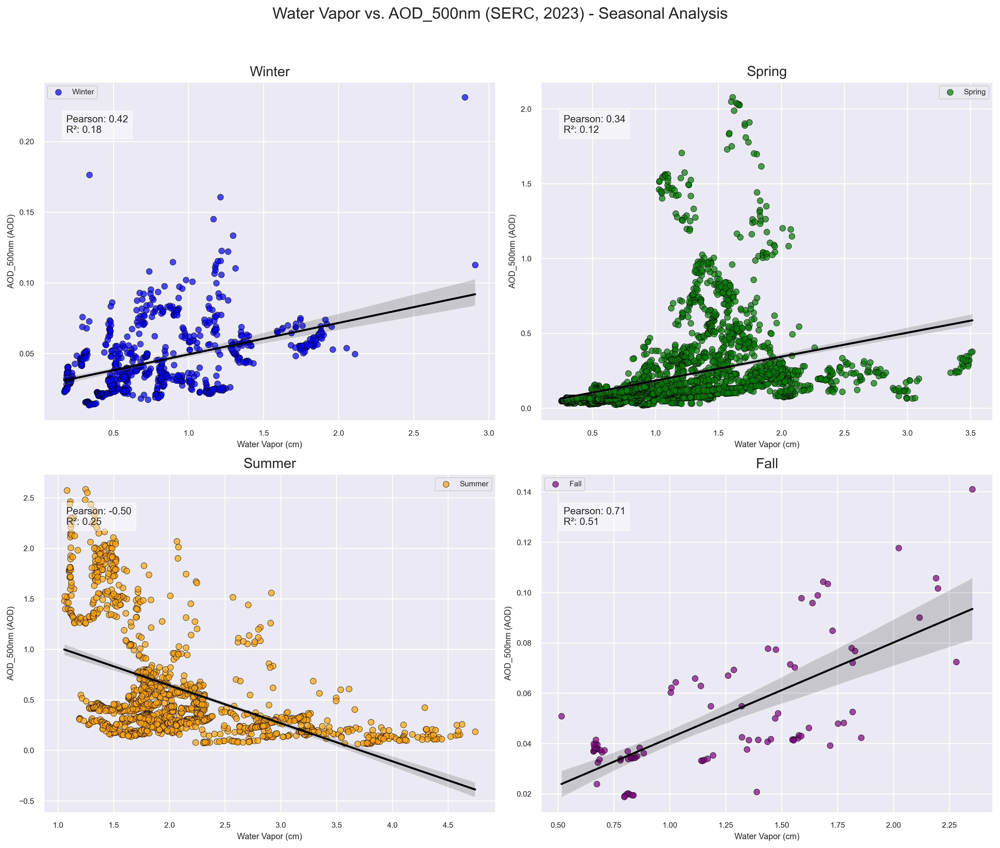

In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

sns.set_theme(rc={"figure.dpi": 300, 'savefig.dpi': 300})
sns.set_theme(font_scale=0.7)

def plot_wv_vs_aod_seasonal(site, year, aod_wavelength="AOD_500nm"):
    """
    Plots a single figure with four subplots showing the relationship between Water Vapor and AOD
    for each season.

    Parameters:
        site (str): The site name (e.g., "HU_IRB", "GSFC", "SERC").
        year (int): The year of the data.
        aod_wavelength (str): The AOD wavelength column to plot (e.g., "AOD_500nm").
    """
    # Define file path
    data_folder = rf"C:\Users\Sandy\Documents\Aeronet\Data\{site}\Processed"
    file_name = f"{site}_processed_{year}_AOD15_directsun.csv"
    file_path = os.path.join(data_folder, file_name)

    # Read the cleaned data
    df = pd.read_csv(file_path, parse_dates=['DateTime'])

    # Drop NaN values before regression
    df_clean = df.dropna(subset=["Precipitable_Water(cm)", aod_wavelength]).copy()

    # Map seasons to colors
    season_map = {
        12: "Winter", 1: "Winter", 2: "Winter",
        3: "Spring", 4: "Spring", 5: "Spring",
        6: "Summer", 7: "Summer", 8: "Summer",
        9: "Fall", 10: "Fall", 11: "Fall"
    }
    df_clean["Month"] = df_clean["DateTime"].dt.month
    df_clean["Season"] = df_clean["Month"].map(season_map)

    # Define the season colors
    season_colors = {"Winter": "blue", "Spring": "green", "Summer": "orange", "Fall": "purple"}

    # Create a 2x2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    fig.suptitle(f"Water Vapor vs. {aod_wavelength} ({site}, {year}) - Seasonal Analysis", fontsize=16)

    # Iterate through each season and plot the jointplot
    for i, (season, color) in enumerate(season_colors.items()):
        ax = axes[i // 2, i % 2]  # Get subplot position

        # Filter data for the current season
        df_season = df_clean[df_clean["Season"] == season]

        # Ensure there's enough data for plotting
        if len(df_season) > 10:
            # Scatter plot with regression line
            sns.scatterplot(ax=ax, data=df_season, x="Precipitable_Water(cm)", y=aod_wavelength,
                            color=color, alpha=0.7, edgecolor='black', label=season)

            sns.regplot(ax=ax, data=df_season, x="Precipitable_Water(cm)", y=aod_wavelength,
                        scatter=False, color="black", line_kws={"linewidth": 2})

            # Compute Pearson correlation and R² value
            slope, intercept, r_value, p_value, std_err = linregress(df_season["Precipitable_Water(cm)"], df_season[aod_wavelength])
            r_squared = r_value ** 2
            correlation = df_season["Precipitable_Water(cm)"].corr(df_season[aod_wavelength])

            # Display Pearson correlation and R² value on the subplot
            ax.text(0.05, 0.85, f"Pearson: {correlation:.2f}\nR²: {r_squared:.2f}",
                    fontsize=10, transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.5))

            ax.set_title(f"{season}", fontsize=14)
            ax.set_xlabel("Water Vapor (cm)")
            ax.set_ylabel(f"{aod_wavelength} (AOD)")

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the suptitle
    plt.show()

# Example usage
plot_wv_vs_aod_seasonal("SERC", 2023, aod_wavelength="AOD_500nm")


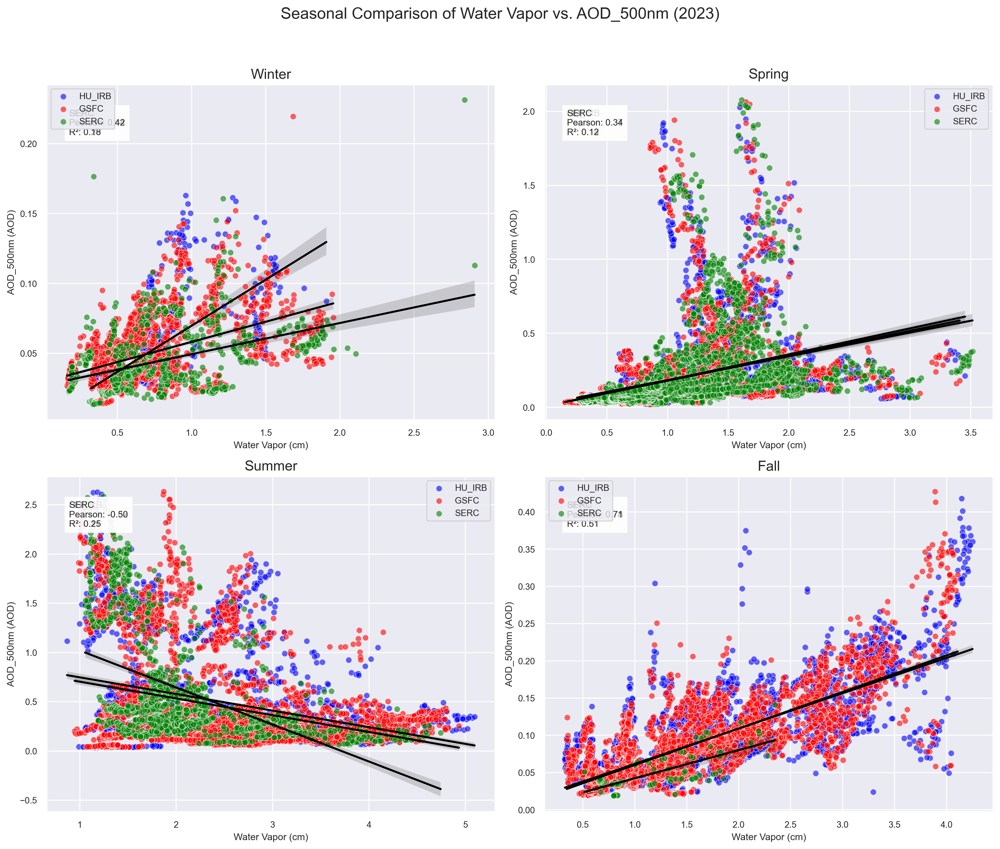

In [4]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy.stats import linregress

sns.set_theme(rc={"figure.dpi": 300, 'savefig.dpi': 300})
sns.set_theme(font_scale=0.8)

def plot_wv_vs_aod_multi_sites(sites, year, aod_wavelength="AOD_500nm"):
    """
    Plots a single figure with four subplots showing the relationship between Water Vapor and AOD
    for each season, comparing all sites together.

    Parameters:
        sites (list): List of site names (e.g., ["HU_IRB", "GSFC", "SERC"]).
        year (int): The year of the data.
        aod_wavelength (str): The AOD wavelength column to plot (e.g., "AOD_500nm").
    """
    
    # Define site colors for differentiation
    site_colors = {"HU_IRB": "blue", "GSFC": "red", "SERC": "green"}
    
    # Map seasons
    season_map = {
        12: "Winter", 1: "Winter", 2: "Winter",
        3: "Spring", 4: "Spring", 5: "Spring",
        6: "Summer", 7: "Summer", 8: "Summer",
        9: "Fall", 10: "Fall", 11: "Fall"
    }
    
    # Create a 2×2 subplot grid
    fig, axes = plt.subplots(2, 2, figsize=(14, 12))
    fig.suptitle(f"Seasonal Comparison of Water Vapor vs. {aod_wavelength} ({year})", fontsize=16)

    # Iterate over each site and read the data
    df_list = {}
    for site in sites:
        data_folder = rf"C:\Users\Sandy\Documents\Aeronet\Data\{site}\Processed"
        file_name = f"{site}_processed_{year}_AOD15_directsun.csv"
        file_path = os.path.join(data_folder, file_name)

        # Read and clean data
        df = pd.read_csv(file_path, parse_dates=['DateTime'])
        df_clean = df.dropna(subset=["Precipitable_Water(cm)", aod_wavelength]).copy()
        df_clean["Month"] = df_clean["DateTime"].dt.month
        df_clean["Season"] = df_clean["Month"].map(season_map)
        
        df_list[site] = df_clean  # Store cleaned data for each site

    # Define seasons and iterate to plot
    seasons = ["Winter", "Spring", "Summer", "Fall"]
    for i, season in enumerate(seasons):
        ax = axes[i // 2, i % 2]  # Select subplot position
        
        for site in sites:
            df_season = df_list[site][df_list[site]["Season"] == season]
            
            if len(df_season) > 10:  # Ensure enough data exists
                # Scatter plot with regression line
                sns.scatterplot(ax=ax, data=df_season, x="Precipitable_Water(cm)", y=aod_wavelength,
                                color=site_colors[site], alpha=0.6, label=site)

                sns.regplot(ax=ax, data=df_season, x="Precipitable_Water(cm)", y=aod_wavelength,
                            scatter=False, color="black", line_kws={"linewidth": 2})
                
                # Compute Pearson correlation and R² value
                slope, intercept, r_value, p_value, std_err = linregress(df_season["Precipitable_Water(cm)"], df_season[aod_wavelength])
                r_squared = r_value ** 2
                correlation = df_season["Precipitable_Water(cm)"].corr(df_season[aod_wavelength])

                # Display Pearson correlation and R² value
                ax.text(0.05, 0.85, f"{site}\nPearson: {correlation:.2f}\nR²: {r_squared:.2f}",
                        fontsize=9, transform=ax.transAxes, bbox=dict(facecolor='white', alpha=0.6))

        ax.set_title(f"{season}", fontsize=14)
        ax.set_xlabel("Water Vapor (cm)")
        ax.set_ylabel(f"{aod_wavelength} (AOD)")
        ax.legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit the suptitle
    plt.show()


# Example usage:
plot_wv_vs_aod_multi_sites(["HU_IRB", "GSFC", "SERC"], 2023, aod_wavelength="AOD_500nm")
